# Ανάλυση και Επεξεργασία Γεωχωρικών Δεδομένων

## *Άσκηση 5: Ανίχνευση Αντικειμένων (Object Detection)*

- Ονομ/νυμο: Χρήστος Νίκου
- AM: 03400146
- Ιδιότητα: Μεταπτυχιακός φοιτητής Επιστήμης Δεδομένων και Μηχανικής Μάθησης (ΕΔΕΜΜ)
- Ηλεκτρονική Διεύθυνση: christosnikou@mail.ntua.gr / chrisnick92@gmail.com


# Περιεχόμενα
- [Α. Μικρή Περιγραφή](#intro)
- [Β. Βήματα](#tasks)
    - [Β.1 Προετοιμασία των δεδομένων](#task1)
    - [Β.2 Μοντέλο Α (Two-stage detector)](#task2)
    - [Β.3 Μοντέλο Β (One-stage detector)](#task3)
    - [Β.4 Αξιολόγηση και οπτικοποίηση αποτελεσμάτων](#task4)
        - [B.4.1 Αξιολόγηση του μοντέλου Faster-RCNN](#task4.1)
        - [B.4.2 Αξιολόγηση του μοντέλου RetinaNet](#task4.2)
- [Γ. Απαντήσεις στις ερωτήσεις](#Q)
    - [Γ.1 Ερώτηση 1](#Q1)
    - [Γ.2 Ερώτηση 2](#Q2)
    - [Γ.3 Ερώτηση 3](#Q3)
    - [Γ.4 Ερώτηση 4](#Q4) 
- [Βιβλιογραφία](#bib)

# Α. Μικρή Περιγραφή <a name ="intro"></a>

Σε αυτό το εργαστήριο ασχολούμαστε με την ανίχνευση αντικειμένων (object detection). Σκοπός είναι να αναπτύξουμε δύο μοντέλα ανίχνευσης αντικείμενων και να συγκρίνουμε τα αποτελέσματά τους. Τα δύο μοντέλα που αναπτύσσουμε στο παρόν Notebook βασίζονται στις δύο επικρατέστερες μεθόδους που χρησιμοποιούνται σε προβλήματα ανίχνευσης αντικειμένων: 1) Στα μοντέλα *δύο φάσεων (two stage detectors)* και 2) στα μοντέλα *μιας φάσης (one stage detectors)*.

- <b>*Two stage detectors:</b>* Τα μοντέλα δύο φάσεων αποτελούν την κύρια προσέγγιση που χρησιμοποιείται στα προβλήματα ανίχνευσης αντικειμένων. Όπως υποδηλώνει και η ονομασία τους, τα μοντέλα που ακολουθούν αυτή την προσέγγιση αντιμετωπίζουν το πρόβλημα σε δύο στάδια. Δεδομένου μιας εικόνας, στο πρώτο στάδιο παράγεται ένα σύνολο από υποψήφιες περιοχές (*region proposals*) της εικόνας στο οποίο περιέχονται τα αντικείμενα που βρίσκονται στην εικόνα. Σκοπός αυτού του πρώτου βήματος είναι να εξαλείψει όλες τις περιοχές της εικόνας που δεν περιέχουν κάποιο αντικείμενο. Αυτό βοηθάει το μοντέλο να επικεντρωθεί στις περιοχές της εικόνας που περιέχουν τα αντικείμενα και εν τέλει να μάθει τα χαρακτηριστικά τους. Έχοντας τις υποψήφιες περιοχές, στο δεύτερο στάδιο γίνεται η κατηγοριοποιήση των εικόνων ανάλογα με το ποιο αντικείμενο περιέχουν.

- <b>*One stage detectors:</b>* Σε αντίθεση με τα μοντέλα δύο φάσεων, τα μοντέλα μιας φάσης πραγματοποιούν την εξαγωγή των περιοχών ενδιαφέροντος καθώς και την κατηγοριοποιησή τους στα διάφορα αντικείμενα συγχρόνως. Δηλαδή, η διαδικασία εκπαίδευσης δε διαχωρίζεται στην εξαγωγή των περιοχών και ύστερα την κατηγοριοποιήσή τους αλλά αποτελεί ένα ενιαίο βήμα. Τα μοντέλα που ακολουθούν αυτή τη μέθοδο εκπαιδεύονται γρηγορότερα από τα μοντέλα δύο φάσεων με κόστος την ακρίβεια στο τελικό αποτέλεσμα.

Στόχος στο παρόν Notebook είναι να αναπτύξουμε δύο μοντέλα: Ένα μοντέλο δύο φάσεων και ένα μοντέλο που ακολουθεί τη μέθοδο της μιας φάση και να συγκρίνουμε τα αποτελέσματά τους. Το μοντέλο δύο φάσεων βασίζεται σε ένα προεκπαιδευμένο δίκτυο τύπου Faster-RCNN από την torchvision ενώ το μοντέλο μιας φάσης βασίζεται σε ένα δίκτυο τύπου RetinaNet. Το σύνολο δεδομένων που θα χρησιμοποιήσουμε αποτελείται από 6 κατηγορίες αντικειμένων (dice, battery, torycar, spoon, highlighter, candle) με εικόνες προέκυψαν μετά από αναζήτηση στο Bing και από κάποια frames από YouTube videos. Συνολικά περιέχει 1644 εικόνες και 2815 αντικείμενα απ'τις παραπάνω 6 κατηγορίες προς ανίχνευση. Το σύνολο δεδομένων είναι διαθέσιμο στο Kaggle στον παρακάτω [σύνδεσμο](https://www.kaggle.com/datasets/markcsizmadia/object-detection-batteries-dices-and-toy-cars).

In [2]:
!pip install pytorch_lightning
!pip install albumentations

# Β. Βήματα <a name ="tasks"></a>

## Β.1 Προετοιμασία των δεδομένων <a name ="task1"></a>

Σε αυτό το σημείο κατασκευάζουμε τη βασική κλάση για την επεξεργασία των δεδομένων ώστε να τα φέρουμε στην κατάλληλη μορφή για να είναι συμβατά με την αρχιτεκτονική των μοντέλων που θα αναπτύξουμε παρακάτω. Το σύνολο των χαρακτηριστικών αποτελείται από τις RGB εικόνες της μορφής $3\times W\times H$, όπου ο αριθμός $3$ αντιστοιχεί στο πλήθος των καναλιών της εικόνας (ένα για το κόκκινο, ένα για το πράσινο και ένα για το μπλε), $W$ είναι ο αριθμός των pixel που βρίσκονται κατά πλάτος και $H$ το πλήθος των pixel που βρίσκονται κατά ύψος της εικόνας. Η ειδοποιός διαφορά στα προβλήματα ανίχνευσης αντικειμένων σε σχέση με τα προβλήματα απλής ταξινόμησης εικόνας σε μια και μόνο κατηγορία είναι ότι μια εικόνα μπορεί να περιέχει πολλά διαφορετικά αντικείμενα. Το κάθε αντικείμενο της εικόνας αναπαρίσταται από ένα ορθογώνιο παραλληλόγραμμο «κουτί» (*bounding box*) με πλευρές παράλληλες προς τους δύο κάθετους άξονες της εικόνας. Αυτό το ορθογώνιο κουτί αποτελείται από 4 ακέραιους αριθμούς στη μορφή $[x_{\min},y_{\min}, x_{\max}, y_{\max}]$, όπου $(x_{\min},y_{\min})$ είναι οι συντεταγμένες της κάτω αριστερής γωνίας και $(x_{\max},y_{\max})$ είναι οι συντεταγμένες της πάνω δεξιάς γωνίας του κουτιού. Έτσι οι ετικέτες, στα προβλήματα ανίχνευσης αντικειμένων αποτελούνται από ένα λεξικό (*dictionary*) με δύο κλειδιά: 1) Το πρώτο κλειδί περιέχει ως τιμή μια λίστα με τα «κουτιά» των αντικειμένων που εμφανίζονται στην εικόνα στο format που περιγράψαμε προηγουμένως και 2) το δεύτερο κλειδί περιέχει μια λίστα με τις ετικέτες των αντικειμένων που αντιστοιχούν σε κάθε ένα από τα παραπάνω κουτιά. Επομένως, πρέπει να κατασκευάζουμε την κλάση που θα επεξεργάζεται τα δεδομένα φέρνοντάς τα σε αυτή τη μορφή. Αρχικά, βλέπουμε την μορφή στην οποία βρίσκονται οι ετικέτες όταν κατεβάζουμε το σύνολο δεδομένων από τον σύνδεσμο στο Kaggle.

In [3]:
import os

DATA_ROOT = "../input/object-detection-batteries-dices-and-toy-cars/dataset/dataset"

with open(os.path.join(DATA_ROOT, "train", "labels", "00000011.txt")) as f:
    print(f.read())

dice 0.0 0 0.0 123 104 289 290 0.0 0.0 0.0 0.0 0.0 0.0 0.0
dice 0.0 0 0.0 227 284 415 506 0.0 0.0 0.0 0.0 0.0 0.0 0.0



Όπως βλέπουμε και παραπάνω οι ετικέτες που αντιστοιχούν στην εικόνα 00000011.jpg περιγράφουν δύο ζάρια των οποίων τα κουτιά περιγράφονται από τις συντεταγμένες $[123,104, 289, 290]$ και $[227, 284, 415, 506]$. Όπως αναφέραμε και προηγουμένως, στο σύνολο των δεδομένων υπάρχουν 6 διαφορετικά αντικείμενα: battery, dice, toycar, candle, highlighter, spoon. Η κωδικοποίηση που χρησιμοποιούμε για κάθε μια από αυτές τις κατηγορίες είναι: 0: battery, 1: dice, 2: toycar, 3: candle, 4: highlighter, 5: spoon.

Το format το οποίο είναι συμβατό με τα μοντέλα ανίχνευσης αντικειμένων που θα αναπτύξουμε παρακάτω είναι ότι κάθε δείγμα του συνόλου δεδομένων πρέπει να αναπαρίσταται από ένα *tuple* δύο διαστάσεων. Στην πρώτη διάσταση πρέπει να βρίσκεται η RGB εικόνα διαστάσεων $3\times H\times W$ σε μορφή tensor και στην δεύτερη διάσταση πρέπει να βρίσκεται ένα *dictionary* με δύο κλειδιά και τιμές τις δύο λίστες που περιγράψαμε προηγούμενως. Έτσι, ο σκοπός της κλάσης *ODDataset* που κατασκευάζουμε παρακάτω είναι να φέρει το σύνολο των δεδομένων σε αυτή τη μορφή. Τέλος, επεξεργαζόμαστε τις εικόνες ώστε να έχουν όλες τις ίδιες διαστάσεις και ίσες με $640\times 640$ χρησιμοποίωντας padding με μηδενικά όπου είναι απαραίτητο. Στα επόμενα κελιά φορτώνουμε τις απαραίτητες βιβλιοθήκες και κατασκευάζουμε τον βασικό κορμό της κλάσης. Στα ορίσματα της κλάσης προσθέτουμε μια μεταβλητή `transforms` η οποία θα αρχικοποιηθεί στο μοντέλο μια φάσης με τους μετασχηματισμούς που θα χρησιμοποιήσουμε. Για το πρώτο μοντέλο δεν χρησιμοποιήουμε κάποιον μετασχηματισμό και έτσι αυτή η μεταβλητή έχει την τιμή `None`.

In [4]:
from torch.utils.data import Dataset, DataLoader, default_collate
from torchvision.io import read_image, ImageReadMode
from torchvision.transforms.functional import convert_image_dtype
from torchvision.utils import draw_bounding_boxes
from matplotlib import pyplot as plt
import torch
import time
import numpy as np
import pandas as pd

In [5]:
# Define a class to handle data loading from disk
class ODDataset(Dataset):
    def __init__(self, data_root, mode="train", transforms = None):
        '''
        data_root: path to the root directory of the dataset
        mode: ["train"(default)/"val"/"test"] available modes/splits of the dataset
        '''
        super().__init__()
        
        assert mode in ["train", "val", "test"]

        self.mode = mode
        self.root = data_root
        self.transforms = transforms
        # Build dataset
        self._build_db()
        
        # Define dataset nomenclanture
        self.categories = {
            "battery": 0,
            "dice": 1,
            "toycar": 2,
            "candle": 3,
            "highlighter": 4,
            "spoon": 5
        }
        
    @property
    def reverse_categories(self) -> dict:
        '''
        Returns a category id to category name mapping as a dict
        '''
        return {v:k for k, v in self.categories.items()}
        
        
    def _build_db(self) -> None:
        '''
        Collect a database of all available samples
        '''
        self.db = pd.read_csv(
            os.path.join(self.root, f"{self.mode}_test.txt"),
            header=None
        ).values.flatten().tolist()
        
    def _parse_sample(self, sample: str) -> tuple:
        '''
        Read image and object detection label data 
        '''
        
        im_file = os.path.join(self.root, self.mode, "images", sample)
        assert os.path.exists(im_file)
        
        label_file = os.path.join(self.root, self.mode, "labels", sample.replace(".jpg", ".txt"))
        assert os.path.exists(label_file)
        
        # read image from disk and convert to [0,1] float32
        im = convert_image_dtype(read_image(im_file, mode=ImageReadMode.RGB), dtype=torch.float32)
        
        # read label in KITTI format and parse labels and bboxes as list of dict {"labels", "boxes"}
        # boxes in xyxy format (left, top, right, bottom)
        labels_kitti = pd.read_csv(label_file, sep=" ", header=None).values
        labels = default_collate([{
            "boxes": torch.from_numpy(row_record[4:8].astype(np.int64)),
            "labels": self.categories[row_record[0]]
        } for row_record in labels_kitti ])
        
        # Apply data augmentation if transforms is not None
        if self.transforms is not None:
                transformed = self.transforms(image = np.transpose(im.numpy(), (1,2,0)),
                                             bboxes = labels['boxes'].numpy(),
                                             class_labels = labels['labels'])
                d = {}
                d['boxes'] = torch.tensor(transformed['bboxes'])
                d['labels'] = torch.tensor(transformed['class_labels'])
                return torch.from_numpy(np.transpose(transformed['image'], (2,0,1))), d
        
        return im, labels
    
    def __getitem__(self, index) -> tuple:
        '''
        Retrieve a specific sample from the dataset
        '''
        sample = self.db[index]
        return self._parse_sample(sample)
    
    def __len__(self):
        '''
        Returns the total number of samples in the dataset
        '''
        return len(self.db)

Έχοντας κατασκευάσει τη βασική κλάση επεξεργασίας των δεδομένων μπορούμε να αρχικοποιήσουμε ένα αντικείμενο από αυτή τη κλάση και να ελέγξουμε τη μορφή των δεδομένων τραβώντας ένα δείγμα μέσω της μεθόδου *getitem*.

In [6]:
# Initialize a dataset instance for testing purposes
dset = ODDataset(DATA_ROOT, mode="train")
sample = dset[0]

print(f"General information about a sample from the ODDataset class\n")
print(f"The sample is of type {type(sample)} with {len(sample)} dimensions")
print(f"The first dimension contains an image of shape {sample[0].shape}")
print(f"The second dimension contains a dictionary with keys {sample[1].keys()} and values {sample[1].values()}")

General information about a sample from the ODDataset class

The sample is of type <class 'tuple'> with 2 dimensions
The first dimension contains an image of shape torch.Size([3, 640, 640])
The second dimension contains a dictionary with keys dict_keys(['boxes', 'labels']) and values dict_values([tensor([[123, 104, 289, 290],
        [227, 284, 415, 506]]), tensor([1, 1])])


Στο παρακάτω κελί κώδικα κατασκευάζουμε μια συνάρτηση για την οπτικοποίηση των εικόνων μαζί με τα bounding boxes για κάθε αντικείμενο που περιέχεται στην εικόνα.

In [7]:
# A small function to visualize images along with bboxes

def draw_image(sample, w=5, h=5):
    # Draw bounding boxes on image
    drawn_image = draw_bounding_boxes(
        image=convert_image_dtype(sample[0], torch.uint8),
        boxes=sample[1]["boxes"],
        labels=[dset.reverse_categories[int(cat_id)] for cat_id in sample[1]["labels"]],
    )
    fig, ax = plt.subplots(figsize = (w,h))
    ax.imshow(drawn_image.permute(1,2,0).numpy())
    plt.show()

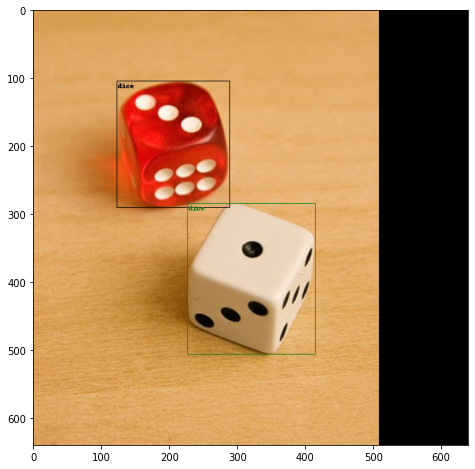

In [8]:
draw_image(sample, w=8, h=8)

Παρακάτω βλέπουμε και ένα δεύτερο δείγμα απ' το σύνολο δεδομένων.

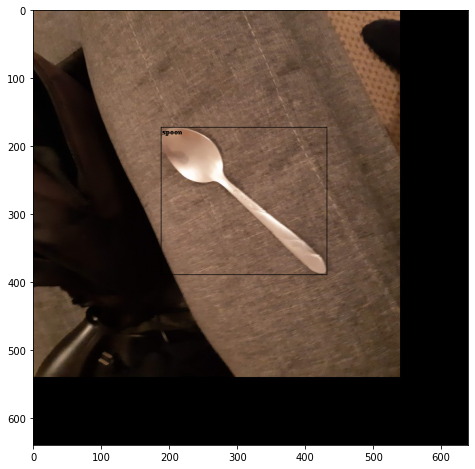

In [9]:
draw_image(dset[1400], w=8, h=8)

## Β.2 Μοντέλο Α (Two-stage detector) <a name ="task2"></a>

Σε αυτό το βήμα κατασκεύαζουμε ένα μοντέλο που βασίζεται στη λογική των *Two-stage detectors*. Η αρχιτεκτονική που θα χρησιμοποιήσουμε βασίζεται σε ένα προεκπαιδευμένο δίκτυο τύπου Faster-RCNN από την torchvision. Πρώτα διαχωρίζουμε το σύνολο των δεδομένων σε train, validation και test sets που θα χρησιμοποιηθούν για την εκπαίδευση του μοντέλου. Η εκπαίδευση του μοντέλου περιλαμβάνει 4 στάδια.

In [10]:
from typing import List, Tuple

train_dset = ODDataset(DATA_ROOT, mode="train")
val_dset = ODDataset(DATA_ROOT,mode="val")
test_dset = ODDataset(DATA_ROOT, mode="test")

# Define an appropriate DataLoader

# Specify a custom collate function to perform manual batching
def custom_collate(samples: List[Tuple[torch.Tensor, dict]]) -> Tuple[List[torch.Tensor], List[dict]]:
    '''
    samples: a list of tuples. Each tuple has a RGB image as a torch.Tensor and a dict with the following:
                    -- "boxes" : Nx4 boxes found in each image
                    -- "labels": N, categories of each object found
    
    Returns (tuple):
        --  List of images (variable sizes allowed) of type torch.Tensor
        --  List of dict with the following data:
                -- "boxes" : Nx4 boxes found in each image
                -- "labels": N, categories of each object found
    '''
    images = [s[0] for s in samples]
    labels = [s[1] for s in samples]
    
    return images, labels

# Define dataloaders for train/val/test splits
train_dloader = DataLoader(train_dset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)
val_dloader = DataLoader(val_dset, batch_size=8, shuffle=False, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)
test_dloader = DataLoader(test_dset, batch_size=8, shuffle=False, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)

Στο επόμενο κελί κατασκευάζουμε την κλάση που περιλαμβάνει την αρχιτεκτονική του μοντέλου καθώς και τη διαδικασία εκπαίδευσης. Στα ορίσματα της κλάσης προσθέτουμε μια μεταβλητή `cls_weight` η οποία αντιστοιχεί στο βάρος που θέλουμε να δώσουμε στο loss που αντιστοιχεί από το classification έναντι στο loss που αντιστοιχεί από την παλινδρόμηση των bounding boxes. Πιο συγκεκριμένα, σε κάθε στάδιο της εκπαίδευσης έχουμε δύο losses: 1) το loss που αντιστοιχεί στην ταξινομήση $\mathcal{L}_{\text{cls}}$ και το loss που αντιστοιχεί από την παλινδρόμηση των bounding boxes $\mathcal{L}_{\text{rgs}}$. Έτσι το τελικό loss είναι ο σταθμισμένος μέσος όρος $\mathcal{L}$ που δίνεται μέσω της 

$$\mathcal{L} = \text{cls_weight}\cdot\mathcal{L}_{\text{cls}}+(1-\text{cls_weight})\cdot \mathcal{L}_{\text{rgs}}.$$

Τιμές της υπερπαραμέτρου κοντά στο $1$ τείνουν να μηδενίσουν το loss που της παλινδρόμησης δίνοντας έμφαση στην ταξινόμηση ενώ αντίστοιχα, τιμές κοντά στο $0$ τείνουν να μηδενίσουν το loss της ταξινομήσης δίνοντας έμφαση στην καλύτερη προσαρμογή των bounding boxes.

In [121]:
import pytorch_lightning as pl
from typing import Optional
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn

# Define a Faster RCNN model
class FasterRCNNModel(pl.LightningModule):
    def __init__(self, num_classes, cls_weight = 0.5):
        '''
        num_classes: Number of target classes in the dataset
        '''
        super().__init__()
        
        # Use a pretrained backbone with "new" ROI head
        self.model = fasterrcnn_resnet50_fpn(
            pretrained=False, 
            progress=False, 
            num_classes=num_classes, 
            pretrained_backbone=True, 
            trainable_backbone_layers=True)
        self.training_phase: Optional[int] = None
            
        self.cls_weight = cls_weight

        self.save_hyperparameters()
        
        
    def forward(self, x: List[torch.Tensor]) -> List[dict]:
        '''
        x: List of images (any size)
        
        Returns:
        - List of dicts with keys (one dict per input image):
            -- "boxes" : Nx4 boxes found in each image
            -- "labels" : N, categories of each object found
            -- "scores" : N, prediction scores for each object found
        '''
        assert not self.training, "Use forward only for inference!"
        
        return self.model(x)
    
        
    def training_step(self, batch, batch_idx):
        '''
        Training logic
        '''
        images, labels = batch
        
        # When in train mode FRCNN returns a dict of losses
        #    -- loss_objectness (RPN)
        #    -- loss_rpn_box_reg (RPN)
        #    -- loss_classifier (ROI Heads)
        #    -- loss_box_reg (ROI Heads)
        losses = self.model(images, labels) 
    
        # Reduce by sum and return the appropriate composite loss function according to the current training phase
        assert self.training_phase is not None
        if self.training_phase % 2 == 0:
            # Phase 0 or 2
            self.log("loss/objectness", losses["loss_objectness"], batch_size=len(images), on_epoch=True, on_step=False)
            self.log("loss/rpn_box_reg", losses["loss_rpn_box_reg"], batch_size=len(images), on_epoch=True, on_step=False)
            return self.cls_weight*losses["loss_objectness"] + (1-self.cls_weight)*losses["loss_rpn_box_reg"]
        else:
            # Phase 1 or 3 
            self.log("loss/classifier", losses["loss_classifier"], batch_size=len(images), on_epoch=True, on_step=False)
            self.log("loss/box_reg", losses["loss_box_reg"], batch_size=len(images), on_epoch=True, on_step=False)
            return self.cls_weight*losses["loss_classifier"] + (1-self.cls_weight)*losses["loss_box_reg"]
        
    
    def configure_optimizers(self):
        '''
        Define optimizer and trainable parameters according to current training phase
        '''
        print(f"Configuring optimizers for training phase : {self.training_phase} / 3")
        assert self.training_phase is not None, "Set training phase first!"
        if self.training_phase == 0:
            # Train only RPN + backbone
            return torch.optim.Adam(
                params=[
                    {"params": self.model.backbone.parameters()},
                    {"params":self.model.rpn.parameters()}
                ],
                lr = 1e-4
            )
        elif self.training_phase == 1:
            # Train only RoiHeads + backbone
            return torch.optim.Adam(
                params=[
                    {"params": self.model.backbone.parameters()},
                    {"params":self.model.roi_heads.parameters()}
                ],
                lr = 1e-4
            )
        elif self.training_phase == 2:
            # Train only RPN 
            return torch.optim.Adam(
                params=self.model.rpn.parameters(), #type: ignore
                lr = 1e-4
            )
        elif self.training_phase == 3:
            # Train only RoiHeads 
            return torch.optim.Adam(
                params=self.model.roi_heads.parameters(), #type: ignore
                lr = 1e-4
            )
        raise AssertionError("Invalid training phase")

In [122]:
# check for device
device = "cuda" if torch.cuda.is_available() else "cpu"

In [123]:
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from copy import deepcopy

# Initialize a Faster RCNN model
model = FasterRCNNModel(num_classes=7,
                       cls_weight = 0.50).to(device)


In [124]:
import time

tic = time.time()
# Train in 4 phases as described in the original paper

# Phase 0
model.training_phase = 0

# Save initial weights of the backbone CNN
p0_backbone_state_dict = deepcopy(model.model.backbone.state_dict())

trainer = pl.Trainer(
    accelerator="gpu", 
    devices=1,
    max_epochs=10,
    default_root_dir="frcnn_p0"
)
trainer.fit(model, train_dataloaders=train_dloader)


# Phase 1

# Restore initial weights of the backbone CNN
model.model.backbone.load_state_dict(p0_backbone_state_dict)

model.training_phase = 1
trainer = pl.Trainer(
    accelerator="gpu", 
    devices=1,
    max_epochs=10,
    default_root_dir="frcnn_p1",
    check_val_every_n_epoch=5
)
trainer.fit(model, train_dataloaders=train_dloader, val_dataloaders=val_dloader)

# Phase 2
model.training_phase = 2
trainer = pl.Trainer(
    accelerator="gpu", 
    devices=1,
    max_epochs=10,
    default_root_dir="frcnn_p2"
)
trainer.fit(model, train_dataloaders=train_dloader)

# Phase 3

model.training_phase = 3
trainer = pl.Trainer(
    accelerator="gpu", 
    devices=1,
    min_epochs=10,
    max_epochs=20,
    default_root_dir="frcnn_p3",
    check_val_every_n_epoch=2,
)
trainer.fit(model, train_dataloaders=train_dloader, val_dataloaders=val_dloader)

total_time = time.time()-tic
mins,secs = divmod(total_time, 60)
print(f"- Training completed in {mins} mins and {secs:.4f} seconds!")

Configuring optimizers for training phase : 0 / 3


Training: 0it [00:00, ?it/s]

Configuring optimizers for training phase : 1 / 3


/opt/conda/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:131: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")


Training: 0it [00:00, ?it/s]

Configuring optimizers for training phase : 2 / 3


Training: 0it [00:00, ?it/s]

Configuring optimizers for training phase : 3 / 3


Training: 0it [00:00, ?it/s]

- Training completed in 92.0 mins and 2.8895 seconds!


## Β.3 Μοντέλο Β (One-stage detector) <a name ="task3"></a>

Σε αυτό το σημείο περνάμε και στη δεύτερη αρχιτεκτονική που θα χρησιμοποιήσουμε η οποία βασίζεται στη λογική των μοντέλων μιας φάσης. Σε αντίθεση αντίθεση με τα μοντέλα δύο φάσεων τα μοντέλα μιας φάσης χρησιμοποιούν ένα ενιαίο δίκτυο για τον υπολογισμό των υποψήφιων περιοχών (region proposals) της εικόνας καθώς και την κατηγοριοποίησή τους στις διάφορες κλάσεις μαζί με τον προσδιορισμό των bounding boxes. Στόχος αυτών των μοντέλων είναι να επιτύχουν ακόμα πιο γρήγορους χρόνους εκπαίδευσης και επεξεργασίας των εικόνων.

Η αρχιτεκτονική που θα χρησιμοποιήσουμε στο παρών Notebook βασίζεται στο paper [Focal Loss for Dense Object Detection](https://arxiv.org/abs/1708.02002) που δημοσιεύθηκε το 2017. Η εργασία αυτή ουσιαστικά αποτελεί την πρώτη εργασία μέσω της οποίας ένα μοντέλο μιας φάσης κατάφερε να πετύχει επιδόσεις πολύ κοντά και να ξεπεράσει ακόμα τις επιδόσεις των μοντέλων δύο φάσεων. Η διαφορά σε σχέση με τα προηγούμενα μοντέλα μιας φάσης βρίσκεται στη συνάρτηση κόστους που χρησιμοποιήθηκε. Πιο συγκεκριμένα, οι συγγραφείς παρατήρησαν ότι ο λόγος που τα μοντέλα μιας φάσης υστερούν απ'αυτά των δύο φάσεων οφείλεται στο μεγάλο πλήθος των υποψήφιων περιοχών που δεν περιλαμβάνουν κάποιο αντικείμενο. Έτσι, κατά τη διαδικασία εκπαίδευσης ενός μοντέλου μιας φάσης το σύνολο των δειγμάτων που δεν περιέχουν αντικείμενα καθοδηγούν την εκμάθηση του μοντέλου με αποτέλεσμα το μοντέλο να μη μαθαίνει τα χαρακτηριστικά που περιγράφουν τα διάφορα αντικείμενα. Πολύ χονδρικά, ο τρόπος με τον οποίο αντιμετώπισαν οι συγγραφείς αυτό το φαίνόμενο ήταν να εισαγάγουν μια νέα συνάρτηση κόστους η οποία να λαμβάνει πολύ μικρές τιμές όταν η πιθανότητα πρόβλεψης είναι πολύ μεγάλη. Το σκεπτικό πίσω από αυτή την ιδέα είναι ότι οι περιοχές που δεν περιλαμβάνουν κάποιο αντικείμενα θα αναγνωρίζονται με υψηλή πιθανότητα από το μοντέλο και έτσι η πιθανότητα πρόβλεψης για αυτές τις περιοχές θα είναι αρκετά υψηλή. Ο τρόπος με τον οποίο το πέτυχαν αυτό ήταν να τροποποιήσουν τη συνάρτηση cross entropy προσθέτοντας έναν παράγοντα αντιστρόφως ανάλογο της πιθανότητα πρόβλεψης. Πιο συγκεκριμένα, αντί για τον υπολογισμό $\text{CE}(p)=-\log(p)$ της cross entropy υπολογίζουν την ποσότητα $\text{FL}(p_t) = (1-p)^{\gamma}\log(p)$, όπου $p$ πιθανότητα πρόβλεψης και $\gamma$ είναι μια υπερπαράμετρος με $\gamma \neq 0$. Μεγάλες τιμές της υπερπαραμέτρου $\gamma>1$ αντιστοιχούν σε μεγαλύτερη ποινή για τις περιοχές που η πιθανότητα σωστής πρόβλεψης είναι πολύ κοντά στο 1.

Το μοντέλο που θα χρησιμοποιήσουμε είναι γνωστό στη βιβλιογραφία ως RetinaNet και η αρχιτεκτονική του παρέχεται έτοιμη από την torchvision. Όπως όλα τα μοντέλα μιας φάσης, η αρχιτεκτονική αποτελείται από ένα αρχικό δίκτυο CNN (*backbone*) το οποίο είναι υπεύθυνο για τον υπολογισμό των χαρακτηριστικών της εικόνας και δύο επιπλέον δίκτυα: ένα για την κατηγοριοποιήση των αντικειμένων και ένα για παλινδρόμηση των bounding boxes. Στο επόμενο κελί κώδικα αρχικοποιούμε το μοντέλο.


In [97]:
# The architecture of the model

from torch import nn
from torchvision.models.detection import retinanet_resnet50_fpn

device = "cuda" if torch.cuda.is_available() else "cpu"

model2 = retinanet_resnet50_fpn(
            pretrained=False, 
            progress=False, 
            num_classes=6, 
            pretrained_backbone=True, 
            trainable_backbone_layers=True).to(device)

Χρησιμοποιούμε τεχνικές επαύξησης δεδομένων χρησιμοποιώντας τη βιβλιοθήκη *albumentations*. Οι δύο τεχνικές αφορούν δύο γεωμετρικούς μετασχηματισμούς της εικόνας: 1) Αναποδογύρισμα της εικόνας με πιθανότητα 0.4, 2) στροφή της εικόνας κατά 90 μοίρες πάλι με πιθανότητα 0.4. O τρίτος μετασχηματισμός κάνει cropping στην εικόνα από διαστάσεις 640 χ 640 σε 400 χ 400 με πιθανότητα 0.3. Τέλος, εφαρμόζουμε και δύο τεχνικές οι οποίες γίνονται κατά pixel. Ο πρώτος μετρατρέπει την εικόνα σε grayscale ενώ ο δεύτερος διαλέγει τυχαία ένα κανάλι από τα RGB και το απενεργοποιεί θέτοντας τις τιμές του σε 0. 

In [98]:
# Configuring a data augmentation pipeline

import albumentations as A

transforms = A.Compose([
    A.RandomRotate90(p=0.4),
    A.VerticalFlip(p=0.4),
    A.RandomSizedBBoxSafeCrop(height = 400, width = 400, p = 0.3),
    A.OneOf([
        A.ToGray(p=1),
        A.ChannelDropout(p=1)
    ], p = 0.3)],
    bbox_params = A.BboxParams(format = 'pascal_voc',
                                               label_fields = ['class_labels']))

Κατασκευάζουμε το σύνολο εκπαίδευσης περνώντας στα ορίσματα τους γεωμετρικούς μετασχηματισμούς που θα εφαρμόσουμε κατά τη διαδικασία εκπαίδευσης. Επίσης, θα εφαρμόσουμε και early stopping στο πάνω στο validation set. Κατά τη διακασία εκπαίδευσης το μοντέλο επιστρέφει, δεδομένου μιας εικόνας ως είσοδο με τα labels, επιστρέφει ένα *dictionary* με δύο κλειδιά που έχουν ως τιμές το classification & regression loss. Το κριτήριο που θα εφαρμόσουμε ως early stopping είναι το σταθμισμένο άθροισμα αυτών των δύο. Ανάλογα με το αν θέλουμε να δώσουμε περισσότερη έμφαση στο classification μπορούμε να αυξήσουμε τον παράγοντα που αντιστοιχεί στο classification loss ή κατ'αντιστοιχία να αυξήσουμε τον παράγοντα του regression loss για να δώσουμε έμφαση στην πρόβλεψη των bounding boxes.

In [99]:
train_dset = ODDataset(DATA_ROOT, mode="train", transforms = transforms)
val_dset = ODDataset(DATA_ROOT,mode="val")
test_dset = ODDataset(DATA_ROOT, mode="test")

# Define dataloaders for train/val/test splits
train_dloader = DataLoader(train_dset, batch_size=8, shuffle=True, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)
val_dloader = DataLoader(val_dset, batch_size=8, shuffle=False, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)
test_dloader = DataLoader(test_dset, batch_size=8, shuffle=False, collate_fn=custom_collate, num_workers=2, prefetch_factor=2)

Παρακάτω βλέπουμε το πρώτο δείγμα του training set μετά τους μετασχηματισμούς.

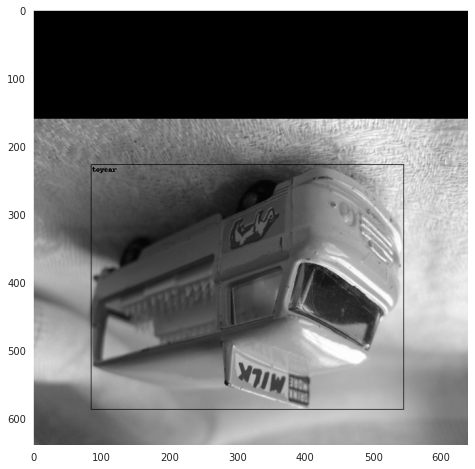

In [100]:
sample = train_dset[350]

draw_image(sample, w=8, h=8)

In [101]:
# Implementation of early stopping

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

Τέλος κατασκευάζουμε μια συνάρτηση που θα αναλαμβάνει την εκπαίδευση του μοντέλου.

In [102]:
# Training loop

from torch.optim import Adam
import seaborn as sns

def retina_training(model, train_dloader, val_dloader,
                   epochs, lr, gamma = 0.5, mod_epochs = 1, early_stopping = False,
                   patience = None, verbose = None, title = None):
    
    # Configure optimizer & initialize the device
    optim = Adam(model.parameters(), lr = lr)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    
    train_loss_list = []
    val_loss_list = []
    counter_epochs = 0
    
    # Activate the early stopping
    if early_stopping:
        ear_stopping = EarlyStopping(patience= patience, verbose=verbose)
    
    for epoch in range(epochs):
        counter_epochs += 1
        model.train() 
        train_loss, val_loss = 0,0
        
        for imgs, targets in train_dloader:
            # Moving everything to device
            imgs = [img.to(device) for img in imgs]
            temp_targets = []
            for label in targets:
                d = {}
                d['boxes'] = label['boxes'].to(device)
                d['labels'] = label['labels'].to(device)
                temp_targets.append(d)
            targets = temp_targets
            # Get the regression & classification loss
            out = model(imgs, targets)
            # Evaluate the loss as the sum of regression & classification
            loss = gamma*out['classification'] + (1-gamma)*out['bbox_regression']
            train_loss += loss.detach().cpu()
            
            # Backpropagation
            optim.zero_grad()
            loss.backward()
            optim.step()
            
        # Calculating the validation loss
        with torch.no_grad():
            for imgs, targets in val_dloader:
                # Moving everything to device
                imgs = [img.to(device) for img in imgs]
                temp_targets = []
                for label in targets:
                    d = {}
                    d['boxes'] = label['boxes'].to(device)
                    d['labels'] = label['labels'].to(device)
                    temp_targets.append(d)
                targets = temp_targets
                
                out = model(imgs,targets)
                val_loss += gamma*out['classification'] + (1-gamma)*out['bbox_regression']
        
        # Calculate the average train & val loss
        train_loss /= len(train_dloader)
        val_loss /= len(val_dloader)
        # Update train & val lists
        train_loss_list.append(train_loss)
        val_loss_list.append(val_loss.cpu())
        
        if (epoch + 1) % mod_epochs == 0:
            print(
                f"Epoch: {epoch + 1}/{epochs}{5 * ' '}Training Loss: {train_loss:.4f}{5 * ' '}Validation Loss: {val_loss:.4f}")
            
        if early_stopping:
            ear_stopping(val_loss, model)
            if ear_stopping.early_stop:
                print("Early stopping")
                break
                
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.set_style("dark")
    ax.plot(range(1, counter_epochs + 1), train_loss_list, label='Train Loss')
    ax.plot(range(1, counter_epochs + 1), val_loss_list, label='Val Loss')
    ax.set_title("Train - Val Loss")
    ax.set_ylabel("Loss")
    ax.set_xlabel("Epochs")
    plt.legend()
    plt.show()

    if early_stopping:
        model.load_state_dict(torch.load("checkpoint.pt"))

    return model, train_loss, val_loss
        

Epoch: 1/40     Training Loss: 0.7613     Validation Loss: 0.5159
Validation loss decreased (inf --> 0.515888).  Saving model ...
Epoch: 2/40     Training Loss: 0.4756     Validation Loss: 0.3395
Validation loss decreased (0.515888 --> 0.339545).  Saving model ...
Epoch: 3/40     Training Loss: 0.4079     Validation Loss: 0.3254
Validation loss decreased (0.339545 --> 0.325363).  Saving model ...
Epoch: 4/40     Training Loss: 0.3329     Validation Loss: 0.2293
Validation loss decreased (0.325363 --> 0.229268).  Saving model ...
Epoch: 5/40     Training Loss: 0.2822     Validation Loss: 0.1957
Validation loss decreased (0.229268 --> 0.195726).  Saving model ...
Epoch: 6/40     Training Loss: 0.2525     Validation Loss: 0.2237
EarlyStopping counter: 1 out of 7
Epoch: 7/40     Training Loss: 0.2478     Validation Loss: 0.2226
EarlyStopping counter: 2 out of 7
Epoch: 8/40     Training Loss: 0.2264     Validation Loss: 0.2283
EarlyStopping counter: 3 out of 7
Epoch: 9/40     Training Loss:

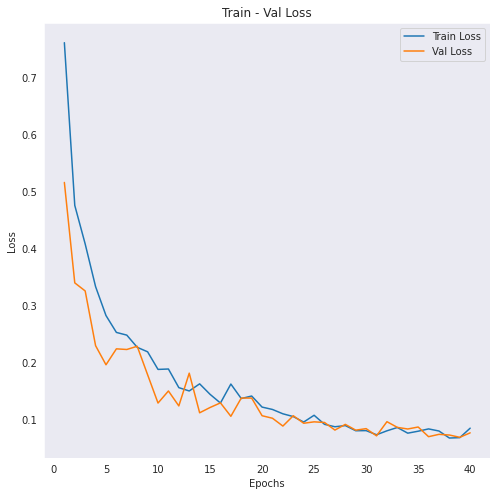

- Training completed in 74.0 and 57.9587 seconds!


In [103]:
tic = time.time()

epochs = 40
lr = 1e-4
patience = 7


model2, train_loss, val_loss = retina_training(model2, train_dloader,
                                             val_dloader, epochs, lr, gamma = 0.80,
                                             early_stopping = True, patience = patience,
                                             verbose = True, title = "Retina")
total_time = time.time()-tic
mins,secs = divmod(total_time, 60)
print(f"- Training completed in {mins} and {secs:.4f} seconds!")

## Β.4 Αξιολόγηση και οπτικοποίηση αποτελεσμάτων <a name ="task4"></a>

Σε αυτή την παράγραφο παρουσιάζουμε τα αποτελέσματα των δύο μοντέλων που αναπτύξαμε προηγούμενως και τα συγκρίνουμε ως προς τον χρόνο εκπαίδευσης και την ακρίβειά τους ως προς το πρόβλημα ανίχνευσης των 6 αντικειμένων. Στη περίπτωση των προβλημάτων ανίχνευσης αντικειμένων η αξιολόγηση των μοντέλων είναι πιο περίπλοκη σε σχέση με τα προβλήματα ταξινόμησης εικόνων. Αυτό συμβαίνει διότι μια εικόνα μπορεί να περιέχει περισσότερα από ένα αντικείμενα και έτσι το μοντέλο μπορεί ενδυνάμει να προβλέψει οσοδήποτε μεγάλο πλήθος αντικειμένων. Ένας άλλος παράγοντας που πρέπει να ληφθεί υπ'όψιν είναι και η πρόβλεψη των bounding boxes που δίνει το μοντέλο για κάθε πρόβλεψη αντικειμένου που κάνει. Η μετρική που έχει αναπτυχθεί και χρησιμοποιείται για την αξιολόγηση και σύγκριση των μοντέλων ανίχνευσης αντικειμένων είναι το *Mean Average Precision (mAP)*. Ένα άρθρο σχετικά με τον υπολογισμό της είναι βρίσκεται στον εξής [σύνδεσμο](https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173).

Για την αξιολόγηση των μοντέλων θα χρησιμοποιήσουμε την υλοποίηση του *Mean Average Precision* που μας παρέχει η βιβλιοθήκη TorchMetrics. Επίσης, για κάθε ένα από τα δύο μοντέλα θα οπτικοποιήσουμε και 8 τυχαίες εικόνες με τις προβλέψεις των αντικειμένων και τα bounding boxes. Γι'αυτό το σκοπό κατασκευάζουμε μια συνάρτηση εν ονόματι *visualize_preds*.

In [104]:
def visualize_preds(model, test_dset, device, title,
                    samples = None, random_state = 42):
    random_samples = []
    np.random.seed(random_state)
    if samples is None:
        indices = np.random.randint(low = 0, high = len(test_dset),
                                size = 8)
    else:
        indices = samples
        
    model.eval()
    for idx in indices:
        random_samples.append(test_dset[idx][0].to(device))
    preds = model(random_samples)
    batch_preds = []
    for i, sample in enumerate(random_samples):
        d = {}
        d['boxes'] = preds[i]['boxes'].cpu()
        d['labels'] = preds[i]['labels'].cpu()
        batch_preds.append((sample.cpu(), d))
    
    fig, ax = plt.subplots(figsize = (22,40),
                          nrows = 4, ncols = 2)
    for i,sample in enumerate(batch_preds):
        drawn_image = draw_bounding_boxes(
            image=convert_image_dtype(sample[0], torch.uint8),
            boxes=sample[1]["boxes"],
            labels=[test_dset.reverse_categories[int(cat_id)] for cat_id in sample[1]["labels"]],
        )
        r,c = divmod(i,2)
        ax[r,c].imshow(drawn_image.permute(1,2,0).numpy())
        ax[r,c].set_title("Predicted image " + str(i+1), fontsize = 20)
    plt.suptitle(title, fontsize = 25)
    plt.show()

Για τον υπολογισμό του Mean Average Precision κατασκευάζουμε τη συνάρτηση *validation_loop*.

In [105]:
from torchmetrics.detection.mean_ap import MeanAveragePrecision

def validation_loop(model, test_dloader, device):
    mAP = MeanAveragePrecision(box_format = "xyxy", class_metrics = True)
    model.eval()
    for imgs, labels in test_dloader:
        imgs = [img.to(device) for img in imgs]
        
        with torch.no_grad():
            preds = model(imgs)
            preds_cpu = []
            for pred in preds:
                d = {}
                d['boxes'] = pred['boxes'].cpu()
                d['labels'] = pred['labels'].cpu()
                d['scores'] = pred['scores'].cpu()
                preds_cpu.append(d)
            mAP.update(preds = preds_cpu, target = labels)
    
    return mAP

### B.4.1 Αξιολόγηση του μοντέλου Faster-RCNN <a name ="task4.1"></a>

In [125]:
model.to(device)
mAP = validation_loop(model, test_dloader, device)

In [126]:
from pprint import pprint
pprint(mAP.compute())

{'map': tensor(0.5482),
 'map_50': tensor(0.6665),
 'map_75': tensor(0.6665),
 'map_large': tensor(0.5801),
 'map_medium': tensor(0.8066),
 'map_per_class': tensor([ 0.0000,  0.8456,  0.7991, -1.0000, -1.0000]),
 'map_small': tensor(-1.),
 'mar_1': tensor(0.4147),
 'mar_10': tensor(0.5673),
 'mar_100': tensor(0.5673),
 'mar_100_per_class': tensor([ 0.0000,  0.8694,  0.8327, -1.0000, -1.0000]),
 'mar_large': tensor(0.5957),
 'mar_medium': tensor(0.8319),
 'mar_small': tensor(-1.)}


Όπως βλέπουμε το μοντέλο Faster-RCNN πετυχαίνει mAP ίσο με 0.54. Ενδιαφέρον έχει και το mAP ανά κατηγορία. Όπως βλέπουμε το μοντέλο δεν μαθαίνει καθόλου την κατηγορία 0 που αντιστοιχεί στις μπαταρίες όπως και τις κατηγορίες που αντιστοιχούν στα κεριά, στους highlighters και στα κουτάλια. Παρακάτω βλέπουμε και μερικές τυχαίες εικόνες από το test set με τις προβλέψεις του μοντέλου.

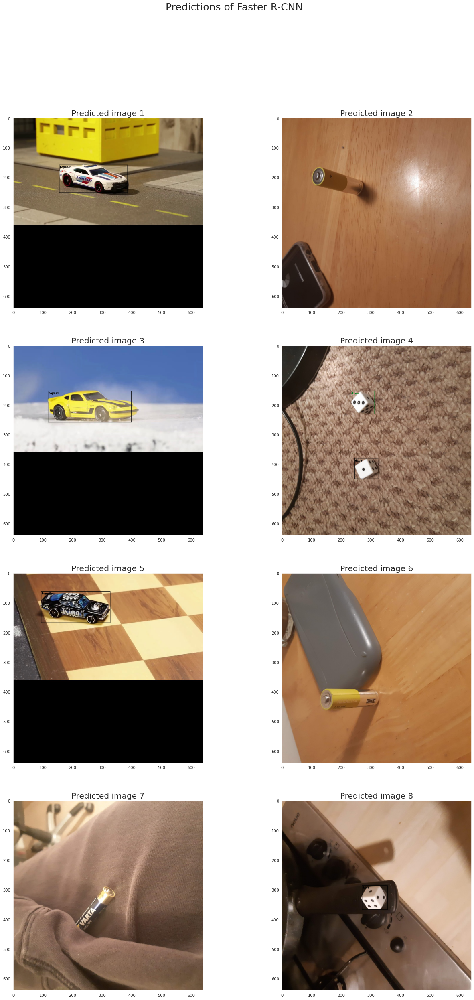

In [127]:
visualize_preds(model, test_dset, device, "Predictions of Faster R-CNN", random_state = 42)

Παρακάτω βλέπουμε και τις προβλέψεις του μοντέλου για τις εικόνες που περιέχουν μπαταρίες, όπως παρατηρούμε το μοντέλο δεν κάνει καμία πρόβλεψη γι'αυτό το αντικείμενο.

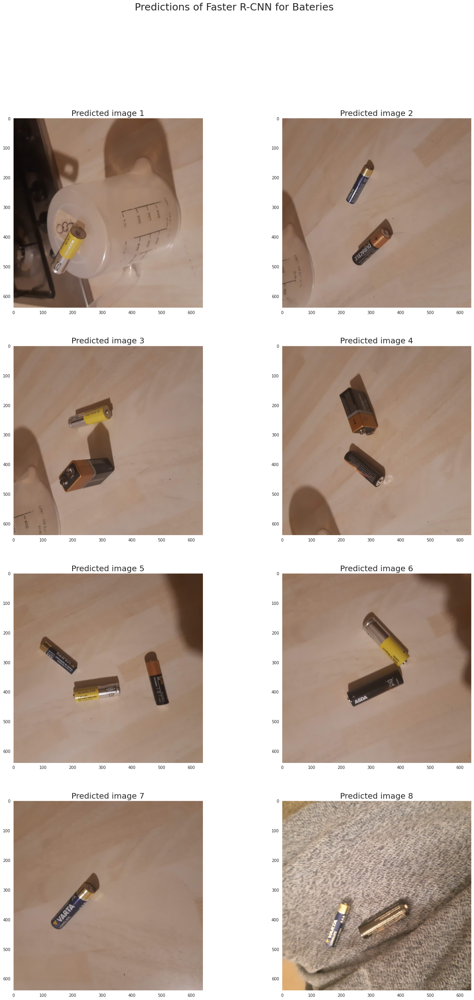

In [128]:
visualize_preds(model, test_dset, device, "Predictions of Faster R-CNN for Bateries", list(range(40,48)))

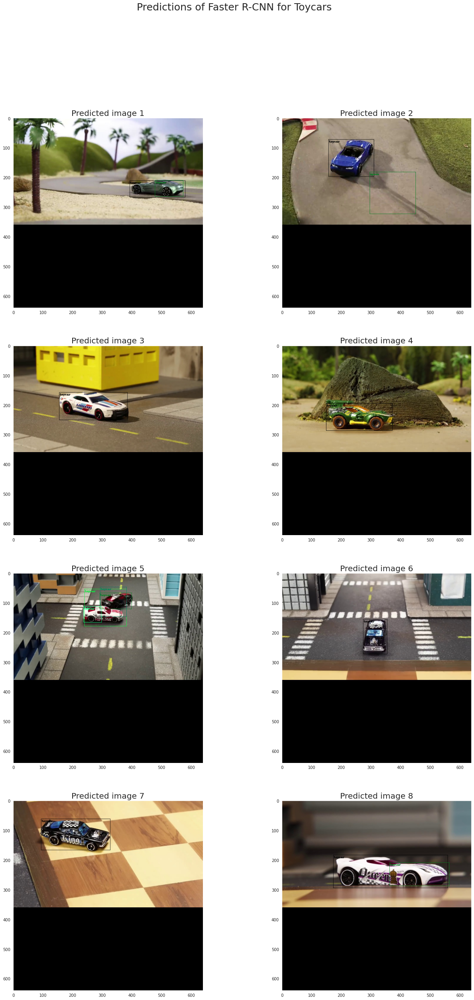

In [129]:
visualize_preds(model, test_dset, device, "Predictions of Faster R-CNN for Toycars", list(range(100,108)))

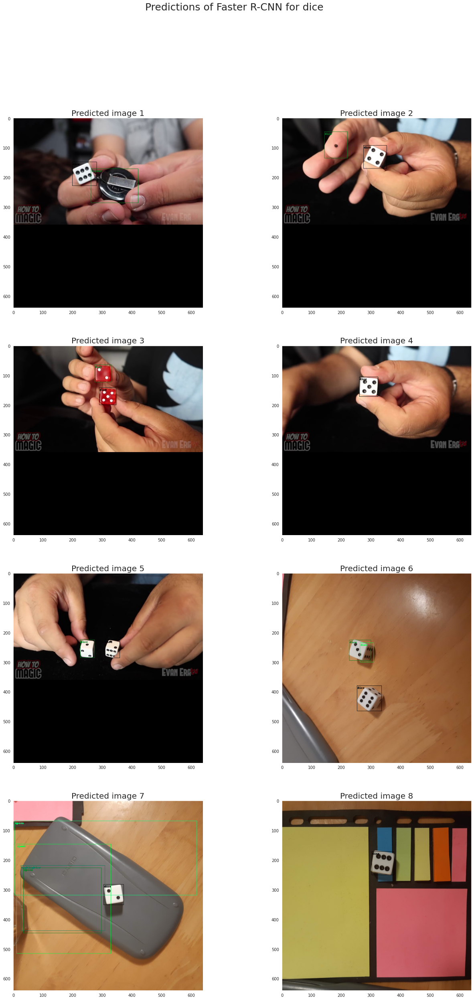

In [130]:
visualize_preds(model, test_dset, device, "Predictions of Faster R-CNN for dice", list(range(0,8)))

### B.4.2 Αξιολόγηση του μοντέλου RetinaNet <a name ="task4.2"></a>

In [106]:
model2.to(device)
mAP = validation_loop(model2, test_dloader, device)

In [107]:
from pprint import pprint
pprint(mAP.compute())

{'map': tensor(0.8400),
 'map_50': tensor(0.9949),
 'map_75': tensor(0.9792),
 'map_large': tensor(0.8615),
 'map_medium': tensor(0.8288),
 'map_per_class': tensor([ 0.8289,  0.8424,  0.8487, -1.0000, -1.0000, -1.0000]),
 'map_small': tensor(-1.),
 'mar_1': tensor(0.6423),
 'mar_10': tensor(0.8684),
 'mar_100': tensor(0.8684),
 'mar_100_per_class': tensor([ 0.8589,  0.8645,  0.8816, -1.0000, -1.0000, -1.0000]),
 'mar_large': tensor(0.8817),
 'mar_medium': tensor(0.8560),
 'mar_small': tensor(-1.)}


Όπως βλέπουμε το μοντέλο RetinaNet πετυχαίνει mAP 0.84 στο test set. Σε αντίθεση με το μοντέλο Faster-RCNN των δύο φάσεων, το μοντέλο μια φάσης μαθαίνει καλύτερα τις εικόνες που περιέχουν μπαταρίες. Αυτό φαίνεται και από τις παρακάτω προβλέψεις. Παρ'όλα αυτά, αυτό το μοντέλο σημειώνει αρκετά false positives καθώς μπερδεύει αρκετά αντικείμενα. Επίσης, κάνει και προβλέψεις σε bounding boxes που δεν περιέχουν κάποιο αντικείμενο. Παρατηρώντας τις παρακάτω εικόνες βλέπουμε ότι οι προβλέψεις αυτές οφείλονται στις τρεις τελευταίες κατηγορίες αντικειμένων τις οποίες δεν έχει μάθει το μοντέλο με αποτελέσμα να κάνει αυτές τις προβλέψεις. Ο λόγος που δεν μπορούν να αποκωδικοποιήσουν τα μοντέλα τις συγκεκριμένες κατηγορίες οφείλεται στο μικρό πλήθος δειγμάτων σε σχέση με τις υπόλοιπες κατηγορίες. Παρακάτω βλέπουμε και την κατανομή των δειγμάτων στις 6 κατηγορίες στο σύνολο εκπαίδευσης.

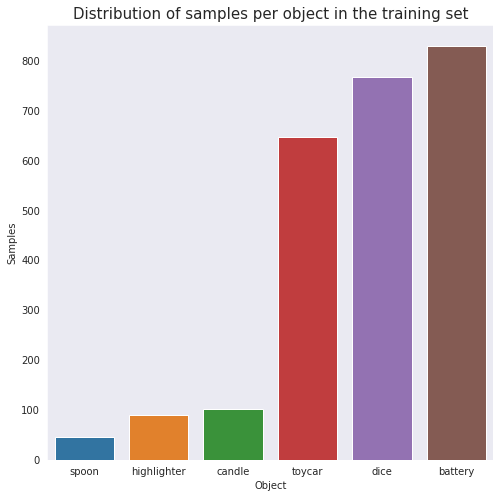

In [114]:
mapping= {0 : "battery", 1: "dice", 2: "toycar", 3: "candle",
          4: "highlighter", 5: "spoon"}
train_dist = {0: 0, 1: 0, 2: 0, 3: 0, 4: 0, 5: 0}

for sample in train_dset:
    array = sample[1]['labels'].numpy()
    for i in range(6):
        train_dist[i] += len(array[array == i])
classes = []
nums = []
for i in range(6):
    classes.append(mapping[i])
    nums.append(train_dist[i])

d = pd.DataFrame({"Object": classes, "Samples": nums}).sort_values(by = "Samples")

fig, ax = plt.subplots(figsize = (8,8))
sns.barplot(data = d, x = "Object", y = "Samples",
           ax = ax)
ax.set_title("Distribution of samples per object in the training set",
            fontsize = 15)
plt.show()

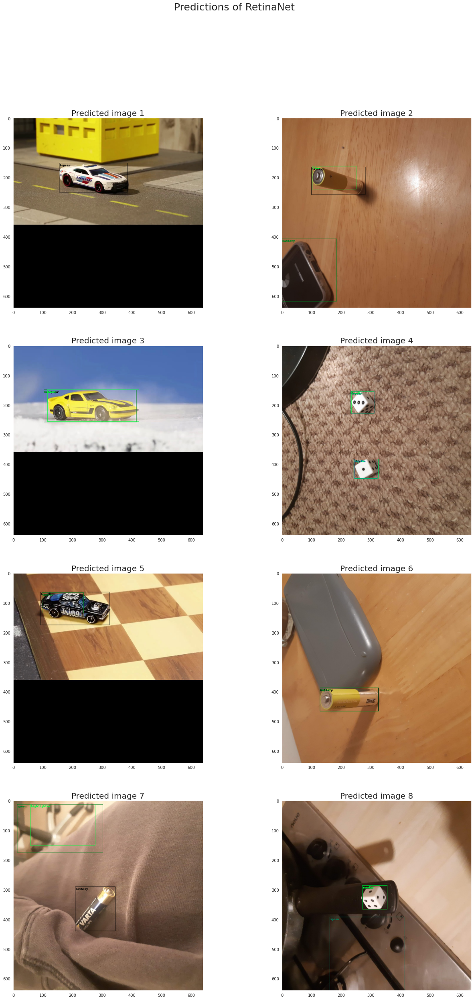

In [115]:
visualize_preds(model2, test_dset, device, "Predictions of RetinaNet", random_state = 42)

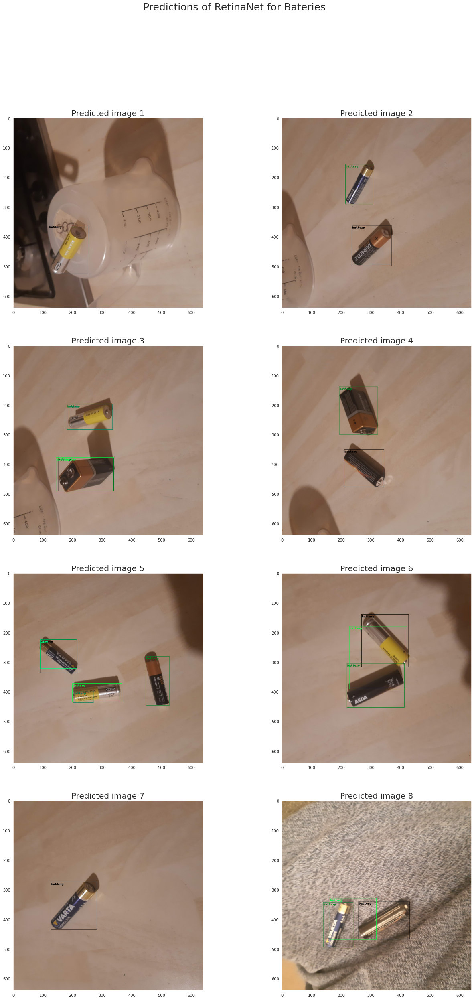

In [116]:
visualize_preds(model2,test_dset,device,"Predictions of RetinaNet for Bateries",list(range(40,48)))

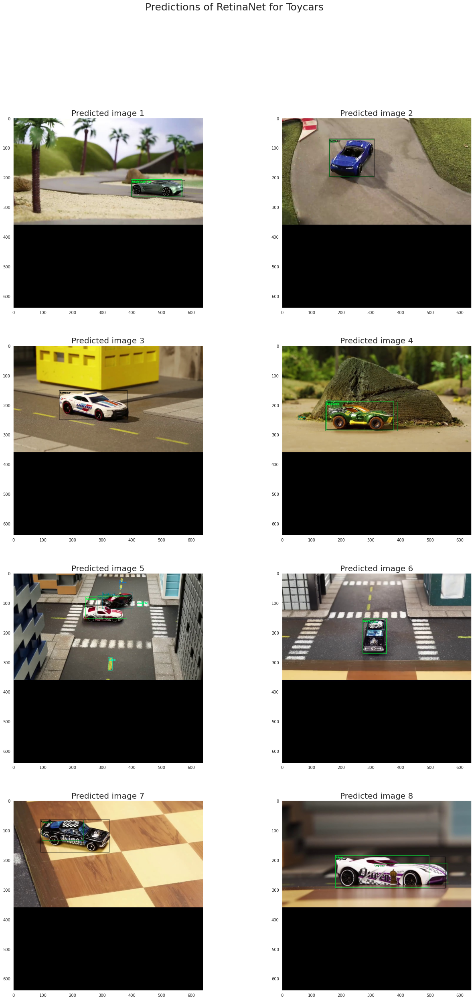

In [117]:
visualize_preds(model2,test_dset,device,"Predictions of RetinaNet for Toycars",list(range(100,108)))

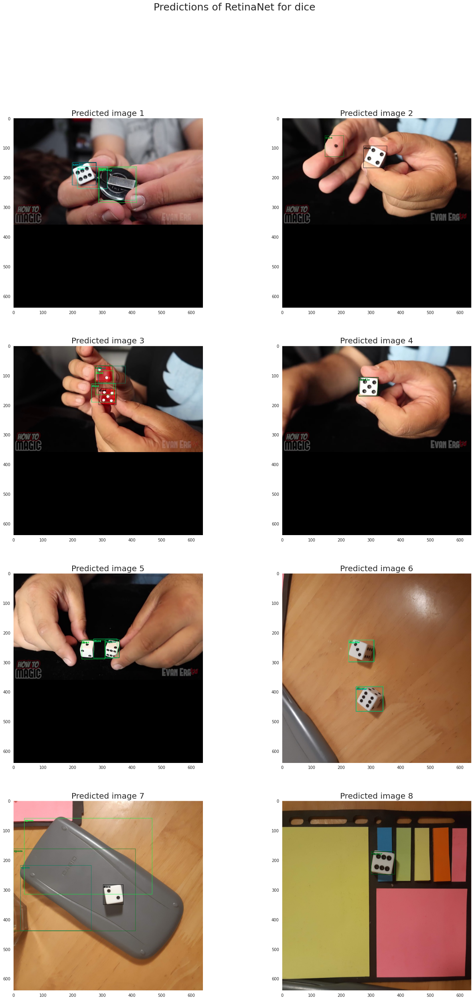

In [120]:
visualize_preds(model2,test_dset,device,"Predictions of RetinaNet for dice",list(range(0,8)))

# Γ. Απαντήσεις στις ερωτήσεις <a name ="Q"></a>

## Γ.1 Ερώτηση 1 <a name ="Q1"></a>

>*Υποθέτουμε ότι κατά την εκπαίδευση του αλγορίθμου Faster-RCNN στο 1ο από τα 4 βήματα εκπαίδευσης επιλέγετε να εφαρμόσετε το κριτήριο πρόωρης διακοπής βασιμένο στη μετρική mAP για να διακόψετε τη διαδικασία εκπαίδευσης στο βέλτιστο αριθμό εποχών. Είναι αυτός ο τρόπος μια κατάλληλη εφαρμογή του κριτηρίου πρόωρης διακοπης; Αιτιολογήστε και προτείνετε έναν εναλλακτικό τρόπο κριτηρίου διακοπής για το συγκεκριμένο βήμα εκπαίδευσης.*

<b>Απάντηση:</b> Το 1ο από τα 4 βήματα εκπαίδευσης του αλγορίθμου Faster-RCNN αναφέρεται στην εκπαίδευση του δικτύου (*Region Proposal Network - RPN*) που παράγει τις υποψήφιες περιοχές (region proposals). Σκοπός αυτού του δικτύου είναι να διαχωρίσει όλες τις υποψήφιες εικόνες ως εικόνες που περιέχουν ή όχι κάποιο αντικείμενο. Με άλλα λόγια, προσπαθεί να λύσει ένα πρόβλημα δυαδικής ταξινόμησης. Επιπλεόν, στις εικόνες που κατηγοριοποιεί στα θετικά δείγματα (δηλαδή σε αυτές που περιέχουν κάποιο αντικέιμενο) προσπαθεί να προσαρμόσει τα bounding boxes όσο το δυνατόν καλύτερα γίνεται στο ground truth box στο οποίο αντιστοιχεί μέσω παλινδρόμησης. Απ'την άλλη μεριά τώρα, η μετρική mAP είναι μια μετρική η οποία χρησιμοποιείται για την τελική αξιολόγηση του μοντέλου. Η μετρική mAP είναι ο μέσος όρος του *Average Precision* για κάθε κατηγορία αντικειμένου ξεχωριστά και διάφορα IoU thresholds με τιμές στο διάστημα $[0.5, 1)$. Έτσι, εφόσον η μετρική mAP λαμβάνει υπ'όψιν το κάθε αντικείμενα ξεχωριστά συμπεραίνουμε ότι δεν είναι η κατάλληλη μετρική για να χρησιμοποιεί σαν κριτήριο στην πρόωρη διακοπή κατά την εκπαίδευση του δικτύου RPN. Εφόσον το πρόβλημα που προσπαθεί να λύσει το δίκτυο RPN είναι ουσιαστικά ένα πρόβλημα κατηγοριοποιήσης εικόνων με 2 κατηγορίες (περιέχουν ή όχι κάποιο αντικείμενο) και πρόβλεψης των bounding boxes στη περίπτωση των θετικών δειγμάτων, τότε μπορούμε να θεωρήσουμε ως μια κατηγορία όλα τα διαφορετικά αντικείμενα και να χρησιμοποιήσουμε το *Average Precision* αυτής της κατηγορίας ως κριτήριο πρόωρης διακοπής κατά την εκπαίδευση.

## Γ.2 Ερώτηση 2 <a name ="Q2"></a>

>*Έχετε εκπαιδεύσει πλήρως ένα μοντέλο Faster-RCNN. Μελετώντας τα αποτελέσματα προκύπτει ότι ενώ τα αντικείμενα ανιχνεύονται ορθά και στις σωστές κατηγορίες, παρατηρούμε ότι τα bounding boxes που προκύπτουν δεν περιγράφουν κατά το βέλτιστο δυνατό τρόπο τα αντικείμενα. Τι θα μπορούσατε να βελτιώσετε κατά τη διαδικασία εκπαίδευσης ώστε να επιτύχετε μια καλύτερη προσαρμογή των bounding boxes των αντικειμένων στην εικόνα.*

<b>Απάντηση:</b> Για να πετύχουμε καλύτερη προσαρμογή των bounding boxes των αντικειμένων των εικόνων σε ένα μοντέλο Faster-RCNN αυτό που μπορούμε να κάνουμε είναι δώσουμε περισσότερη έμφαση στο loss που προκύπτει από την παλινδρόμηση για την καλύτερη προσαρμογή των bounding boxes. Για να το πετύχουμε αυτό μπορούμε στα βήματα 1 και 3 που αφορούν την εκπαίδευση του RPN δικτύου να τροποποιήσουμε το loss που προκύπτει ως το ο σταθμισμένος μέσος του classification loss και του regression loss αυξάνοντας το βάρος που αντιστοιχεί στο regression loss. Πιο συγκεκριμένα, αν συμβολίσουμε με $\mathcal{L}_{\text{cls}}$ το loss που αντιστοιχεί για το classification και με $\mathcal{L}_{\text{rgs}}$ το loss που αντιστοιχεί για την παλινδρόμηση μπορούμε να αναγκάσουμε το μοντέλο να μεταβάλει τις παραμέτρους του κατά τη διαδικασία εκπαίδευσης για να πετύχει καλύτερη προσαρμογή των bounding boxes εισάγοντας μια υπερπαράμετρο $\gamma$ και να υπολογίσουμε ως συνολικό loss την ποσότητα

$$\mathcal{L}_{\text{total}} = \gamma\cdot \mathcal{L}_{\text{rgs}} + (1-\gamma)\cdot \mathcal{L}_{\text{cls}}.$$

Έτσι, τιμές της υπερπαραμέτρου $\gamma$ κοντά στο 1 τείνουν να μηδενίσουν το loss που προκύπτει από την ταξινόμηση με αποτέλεσμα η ανανέωση των παραμέτρων του μοντέλου να γίνεται με σκοπό την καλύτερη προσαρμοργή των bounding boxes. Σε δεύτερη φάση μπορούμε να αυξήσουμε τον αριθμό των εποχών εκπαίδευσης στα βήματα που αφορούν την εκπαίδευση του δικτύου RPN (βήματα 1 και 3) και να εφαρμόσουμε τεχνικές ομαλοποίησης όπως π.χ. early stopping κ.α.

## Γ.3 Ερώτηση 3 <a name ="Q3"></a>

>*Ας υποθέσουμε ότι έχουμε συλλέξει δεδομένα από ένα UAV πάνω έναν αυτοκινητόδρομο με στόχο να ανιχνεύσουμε τα αυτοκίνητα που διέρχονται. Κάθε εικόνα είναι ανάλυσης 4Κ, δηλαδή ανάλυσης 3840 x 2160 pixel και απεικονίζει ένα τμήμα αυτοκινητόδρομου μήκους περίπου 100 μέτρων. Τι δυσκολίες αναμένετε να αντιμετωπίσετε για το πρόβλημα της ανίχνευσης των οχημάτων; Προτείνετε πιθανές λύσεις για το πρόβλημα.*

<b>Απάντηση:</b> Το πρόβλημα που εμφανίζεται στην ανίχνευση οχημάτων σε αυτοκινητόδρομο από εικόνες υψηλής ανάλυσης είναι ότι τα bounding boxes που αντιστοιχούν στα οχήματα αποτελούνται από πολύ λίγα pixel σε σχέση με τα υπόλοιπα αντικείμενα που αντιστοιχούν στο φόντο της εικόνας (π.χ. δέντρα, δρόμος, οροφές σπιτιών κ.α.). Έτσι, ένα μοντέλο τύπου Faster-RCNN που χρησιμοποιεί anchor boxes συγκεκριμένου μεγέθους για να εξαγάγει τα region proposals θα είναι αρκετά δύσκολο να αποκωδικοποιήσει τα μικρά σε μέγεθος bounding boxes που αντιστοιχούν στα οχήματα με αποτέλεσμα οι τελικές υποψήφιες περιοχές να περιέχουν αρκετά pixel που περιέχουν και άλλα αντικείμενα πέραν των οχημάτων. Αυτό θα έχει ως να μην μπορέσει το μοντέλο να αποκωδικοποιήσει την πληροφορία που περιέχουν τα οχήματα με αποτελέσμα να κάνει πολλές λανθασμένες προβλέψεις σε μελλοντικά δείγματα. Ένας τρόπος για να αντιμετωπίσουμε αυτό το φαινόμενο είναι να προεπεξεργαστούμε την εικόνα χρησιμοποιώντας cropping και rescale έτσι ώστε να παράξουμε εικόνες στις οποίες τα οχήματα να καταλαμβάνουν μεγαλύτερο χώρο.

## Γ.4 Ερώτηση 4 <a name ="Q4"></a>

>*Ας υποθέσουμε ότι στα πλαίσια ανάπτυξης ενός αλγορίθμου καταμέτρησης πλήθους ανθρώπων σε μία συναυλία επιλέγουμε να σχεδιάσουμε έναν αλγόριθμο ανίχνευσης ως ενδιάμεσο βήμα. Ποιο υποτμήμα ενός τυπικού αλγορίθμου ανίχνευσης θεωρείτε ότι θα προκαλέσει τις μεγαλύτερες δυσκολίες και γιατί;*

<b>Απάντηση:</b> Στα πλαίσια ανάπτυξης ενός αλγορίθμου καταμέτρησης πλήθους ανθρώπων σε μία συναυλία το βήμα που θα προκαλέσει τις μεγαλύτερες δυσκολίες θα είναι η εκπαίδευση του δικτύου RPN που είναι υπεύθυνο για τον προσδιορισμό των υποψήφιων περιοχών (region proposals). Αυτό συμβαίνει γιατί στις εικόνες από συναυλίες αντιστοιχεί μεγάλο πλήθος ανθρώπων σε σχετικά μικρό πλήθος pixel. Έτσι, κατά τη διάρκεια εκπαίδευσης του RPN είναι πιθανό δύο άνθρωποι που βρίσκονται δίπλα στην εικόνα να αναγνωρίζονται ως ένα αντικείμενο από το μοντέλο και έτσι το bounding box που να παράγει το μοντέλο να καλύπτει είτε τον έναν από τους δύο είτε και τους δύο μαζί θεωρώντας τους ως ένα αντικείμενο.

# Βιβλιογραφία <a name ="bib"></a>

- [1] [Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks](https://arxiv.org/abs/1506.01497?eva_src=hottopics)
- [2] [Fast R-CNN](https://arxiv.org/abs/1504.08083?so)
- [3] [Feature Pyramid Networks for Object Detection](https://arxiv.org/abs/1612.03144)
- [4] [Focal Loss for Dense Object Detection](https://arxiv.org/abs/1708.02002)
- [5] [Rich feature hierarchies for accurate object detection and semantic segmentation](https://arxiv.org/abs/1311.2524)
- [6] [Spatial Pyramid Pooling in Deep Convolutional Networks for Visual Recognition](https://arxiv.org/abs/1406.4729)